<h1 align="center">Volume 2: The Fourier Transform.</h1>

    R Scott Collings
    Math 321 Sec 002
    27 Nov 2018

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
from scipy import fftpack
import numpy as np
import IPython
from copy import deepcopy
from scipy import signal
from imageio import imread

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples

    # Problems 1.1 and 1.7
    def plot(self, transform=False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        x = np.linspace(0,len(self.samples)/self.rate,len(self.samples))
        if (transform):
            plt.subplot(121)
        plt.ylim(-32768,32767)
        plt.xlabel('sample index')
        plt.ylabel('sample')
        plt.gca().set_title('Audio File')
        plt.plot(x,self.samples)
        if(transform):
            dft = np.abs(fftpack.fft(self.samples))
            plt.subplot(122)
            plt.xlim(0,self.rate / 2)
            plt.plot(x * self.rate * self.rate / len(self.samples),dft)
            plt.gca().set_title('Audio File DFT')
            plt.xlabel('frequency')
            plt.ylabel(r'$c_k$')
        plt.show()

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        samples = deepcopy(self.samples)
        if(type(self.samples[0]) != np.int16 or force):
            samples = np.real(samples * 32768.0 / np.max(np.abs(samples))).astype(np.int16)
        wavfile.write(filename,self.rate,samples)
        
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        if(len(self.samples) != len(other.samples) or self.rate != other.rate):
            raise ValueError("Sound files must be same length and sample rate")
        return SoundWave(self.rate,self.samples + other.samples)

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if(self.rate != other.rate):
            raise ValueError('Sound files must have same sample rate')
        return SoundWave(self.rate,np.append(self.samples,other.samples))
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if (self.rate != other.rate):
            raise ValueError('Sample rates must match')
        diff = len(self.samples) - len(other.samples)
        samples = []
        f_hat = []
        g_hat = []
        if (diff > 0):
            samples = np.append(deepcopy(other.samples), np.zeros(diff))
            f_hat = fftpack.fft(self.samples)
            g_hat = fftpack.fft(samples)
        else:
            samples = np.append(deepcopy(self.samples), np.zeros(abs(diff)))
            f_hat = fftpack.fft(samples)
            g_hat = fftpack.fft(other.samples)
        return SoundWave(self.rate,fftpack.ifft(np.multiply(f_hat,g_hat)))
            

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if (self.rate != other.rate):
            raise ValueError('Sample rates must match')
        n = len(self.samples)
        m = len(other.samples)
        length = 1
        while length < n + m - 1:
            length *= 2
        samples1 = SoundWave(self.rate,np.append(self.samples,np.zeros(length - n)))
        samples2 = SoundWave(other.rate,np.append(other.samples,np.zeros(length - m)))
        SW = samples1 * samples2
        return SoundWave(SW.rate,SW.samples[:n + m - 1])
        
            

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        low_freq = low_freq * len(self.samples) // self.rate
        high_freq = high_freq * len(self.samples) // self.rate
        dft = fftpack.fft(self.samples)
        self.samples = fftpack.ifft(
            np.append(
                np.append(dft[:low_freq],np.zeros_like(dft[low_freq:high_freq])),
                np.append(
                    np.append(dft[high_freq:-high_freq],np.zeros_like(dft[-high_freq:-low_freq])),
                    dft[-low_freq:])
            )
        )
        

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

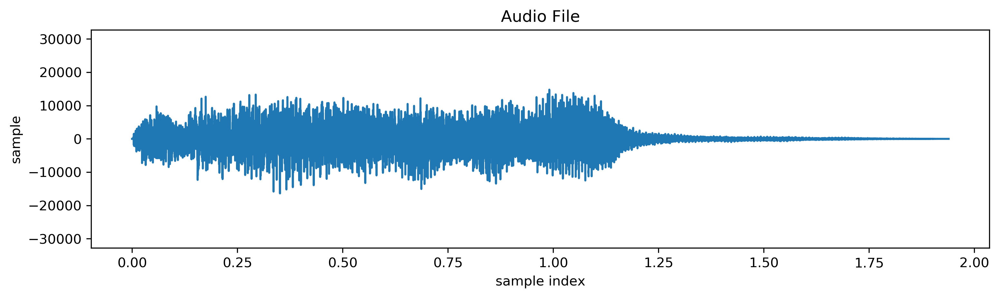

In [4]:
rate,samples = wavfile.read('tada.wav')
SW = SoundWave(rate,samples)
SW.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [5]:
rate,samples = wavfile.read('tada.wav')
SW = SoundWave(rate,samples)
SW.export('tadaNotScaled.wav')
SW.export('tadaScaled.wav',force=True)
IPython.display.Audio('tada.wav')

In [6]:
IPython.display.Audio('tadaNotScaled.wav')

In [7]:
IPython.display.Audio('tadaScaled.wav')

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [8]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    x = np.linspace(0,duration,44100 * duration)
    f = np.sin(2 * np.pi * frequency * x)
    return SoundWave(44100,f)
    

In [9]:
SW = generate_note(440,2)
SW.export('a4note.wav')
IPython.display.Audio('a4note.wav')

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [10]:
SWA = generate_note(440,3)
SWC = generate_note(523.25,3)
SWE = generate_note(659.25,3)
SW = SWA + SWC + SWE
SW.export('aceChord.wav')
IPython.display.Audio('aceChord.wav')

In [11]:
SWA = generate_note(440,1)
SWC = generate_note(523.25,1)
SWE = generate_note(659.25,1)
SW = SWA >> SWC >> SWE
SW.export('aceArpeggio.wav')
IPython.display.Audio('aceArpeggio.wav')

### Problem 1.5

- Implement `simple_dft()` with the formula for $c_k$ given below.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [12]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples)
    x = range(n)
    W = (1/n) * np.array([[np.exp(-2 * np.pi * 1j * l * k / n) for l in x] for k in x])
    return W @ samples

In [13]:
%time mine = simple_dft(np.array([1,6,2,4]))
print(mine)
theirs = fftpack.fft(np.array([1,6,2,4]))
print(theirs)
np.allclose(mine, theirs / len(theirs))

CPU times: user 1.2 ms, sys: 99 µs, total: 1.3 ms
Wall time: 12.9 ms
[ 3.25+0.0000000e+00j -0.25-5.0000000e-01j -1.75-4.2862638e-16j
 -0.25+5.0000000e-01j]
[13.+0.j -1.-2.j -7.+0.j -1.+2.j]


True

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [14]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    def split(g):
        n = len(g)
        if (n <= threshold):
            return simple_dft(g)
        else:
            even = split(g[::2])
            odd = split(g[1::2])
            z = np.array([np.exp(-2 * np.pi * 1j * y / n) for y in range(0,n)])
            m = n // 2
            return np.append((even + np.multiply(z[:m], odd)), (even + np.multiply(z[m:], odd)))
    return split(samples) / len(samples)

In [17]:
x = np.random.rand(8192)
%time bad = simple_dft(x)
%time mine = simple_fft(x)
%time theirs = fftpack.fft(x)
np.allclose(mine * len(mine),theirs)

KeyboardInterrupt: 

CPU times: user 774 ms, sys: 16 µs, total: 774 ms
Wall time: 1.14 s
CPU times: user 115 µs, sys: 3 µs, total: 118 µs
Wall time: 124 µs


True

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

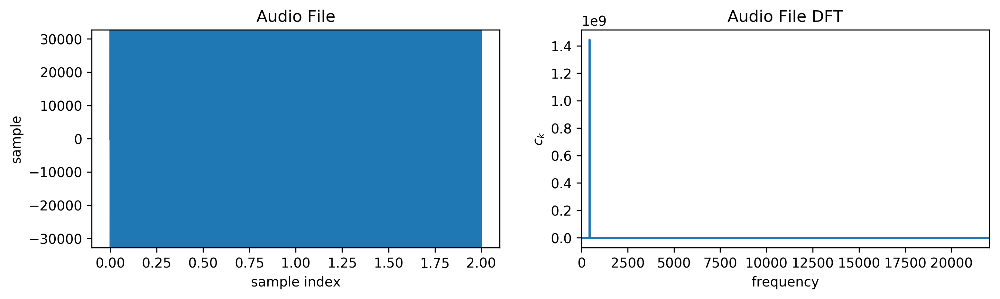

In [19]:
rate,samples = wavfile.read('a4note.wav')
SW = SoundWave(rate,samples)
SW.plot(transform=True)

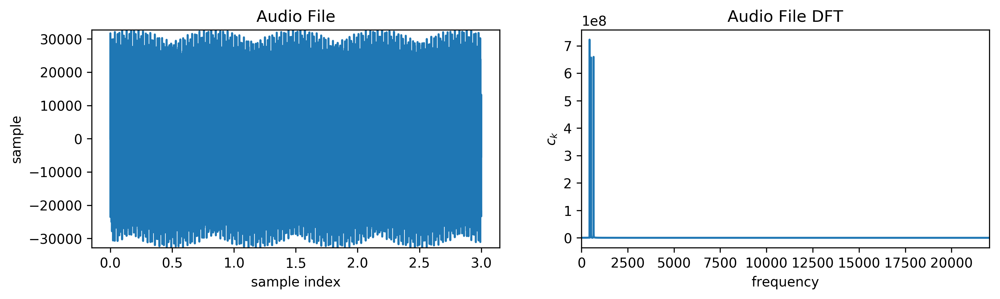

In [20]:
rate,samples = wavfile.read('aceChord.wav')
SW = SoundWave(rate,samples)
SW.plot(transform=True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

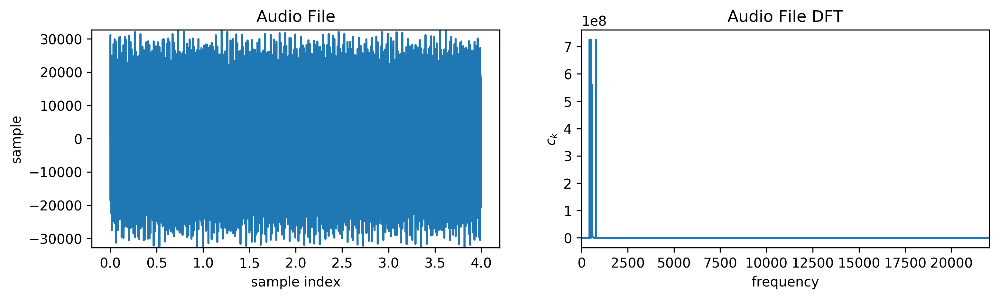

In [21]:
rate,samples = wavfile.read('mystery_chord.wav')
SW = SoundWave(rate,samples)
SW.plot(transform=True)

In [22]:
x = fftpack.fft(SW.samples)
notes = np.where(np.abs(x[:len(SW.samples) // 2]) > 5e8)[0]
notes * SW.rate / len(SW.samples)

array([ 440.  ,  523.25,  587.5 ,  784.  ])

The notes are...A C D G

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [22]:
rate,samples = wavfile.read('tada.wav')
SWTada = SoundWave(rate,samples)
whiteNoise = SoundWave(rate,np.random.randint(-32767, 32767, rate * 2, dtype=np.int16))
SW = SWTada * whiteNoise
SW.export('whiteNoiseTada.wav')
IPython.display.Audio('whiteNoiseTada.wav')

In [23]:
SWLoop = SW >> SW
SWLoop.export('loopedWhiteNoiseTada.wav')
IPython.display.Audio('loopedWhiteNoiseTada.wav')

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [24]:
rate1,samples1 = wavfile.read('CGC.wav')
rate2,samples2 = wavfile.read('GCG.wav')
SWCGC = SoundWave(rate1,samples1)
SWGCG = SoundWave(rate2,samples2)
%time SW1 = SWCGC ** SWGCG
print(samples1)
print(samples2)
%time convolved = signal.fftconvolve(samples1,samples2)
SW2 = SoundWave(rate1,convolved)
SW1.export('powLinConvolve.wav')
SW2.export('scipyLinConvolve.wav')
IPython.display.Audio('CGC.wav')

CPU times: user 303 ms, sys: 14 ms, total: 317 ms
Wall time: 80.1 ms
[    0  2440  4867 ..., 32403 32675 32767]
[    0  3652  7259 ..., -9251 -5689 -2057]
CPU times: user 61 ms, sys: 2 ms, total: 63 ms
Wall time: 19.5 ms


In [25]:
IPython.display.Audio('GCG.wav')

In [26]:
IPython.display.Audio('powLinConvolve.wav')

In [27]:
IPython.display.Audio('scipyLinConvolve.wav')

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [28]:
IPython.display.Audio('chopin.wav')

In [29]:
IPython.display.Audio('balloon.wav')

In [30]:
rate1,samples1 = wavfile.read('chopin.wav')
rate2,samples2 = wavfile.read('balloon.wav')
samples = signal.fftconvolve(samples1,samples2)
SW = SoundWave(rate1,samples)
SW.export('chopinBalloon.wav')
IPython.display.Audio('chopinBalloon.wav')

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [31]:
IPython.display.Audio('noisy1.wav')

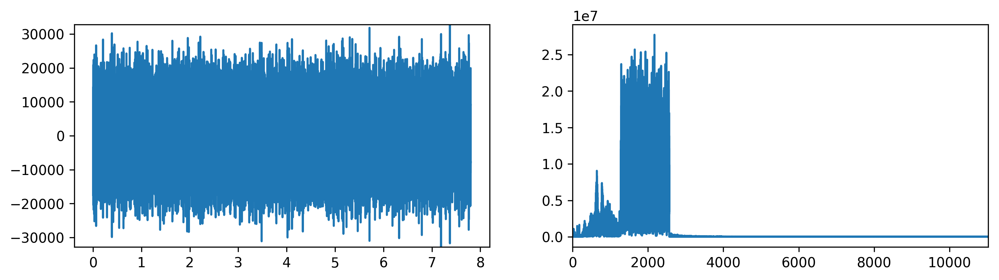

/usr/local/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


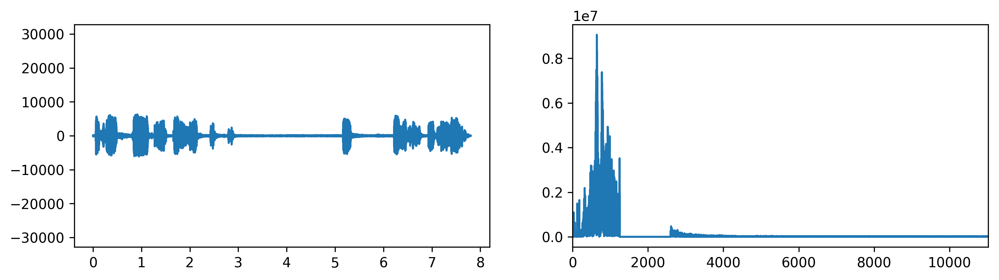

In [32]:
rate,samples = wavfile.read('noisy1.wav')
SW = SoundWave(rate,samples)
SW.plot(transform=True)
SW.clean(1250,2600)
SW.plot(transform=True)
SW.export('clean1.wav')
IPython.display.Audio('clean1.wav')

In [33]:
IPython.display.Audio('noisy2.wav')

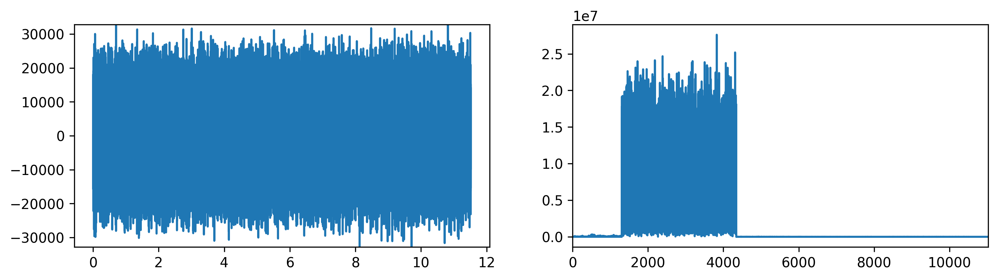

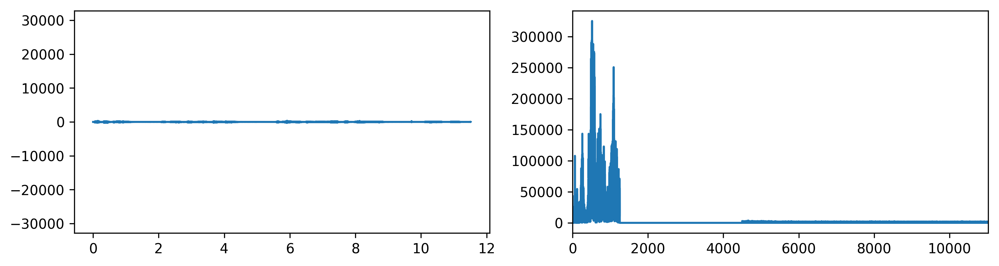

In [34]:
rate,samples = wavfile.read('noisy2.wav')
SW = SoundWave(rate,samples)
SW.plot(transform=True)
SW.clean(1250,4500)
SW.plot(transform=True)
SW.export('clean2.wav')
IPython.display.Audio('clean2.wav')

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

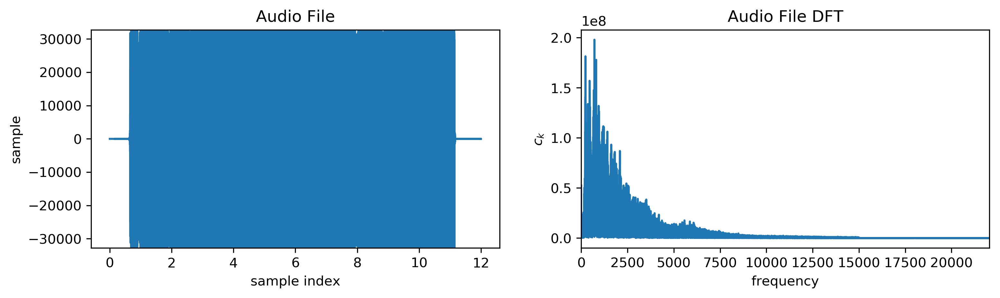

MemoryError: In draw_path: Out of memory

<Figure size 3600x900 with 2 Axes>

In [43]:
rate,samples = wavfile.read('vuvuzela.wav')
samples1 = samples.T[0]
samples2 = samples.T[1]
SW1 = SoundWave(rate,samples1)
SW1.plot(transform=True)
SW2 = SoundWave(rate,samples2)
SW2.plot(transform=True)

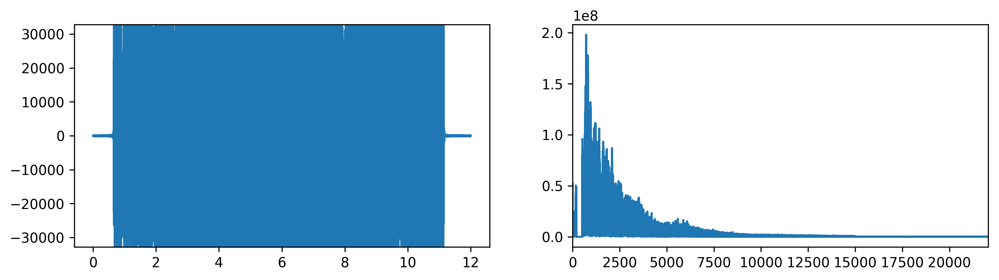

In [37]:
SW1.clean(200,15000)
SW1.plot(transform=True)

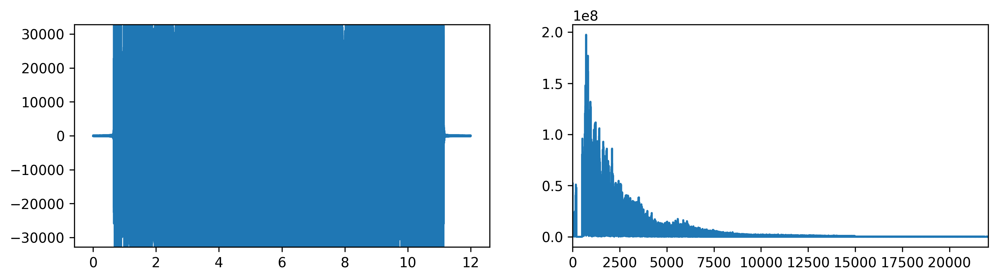

In [38]:
SW2.clean(200,15000)
SW2.plot(transform=True)

In [41]:
wavfile.write('noVuvuzela.wav',rate,np.array([SW1.samples,SW2.samples]).astype(np.int16).T)
IPython.display.Audio('noVuvuzela.wav')

/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: ComplexWarning: Casting complex values to real discards the imaginary part
  """Entry point for launching an IPython kernel.


### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

(216, 433) <class 'numpy.uint8'>


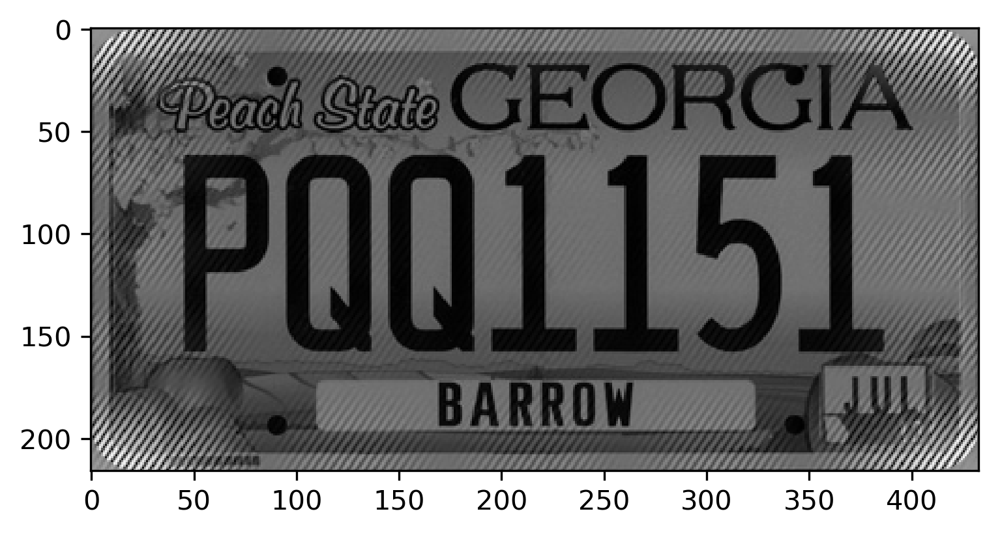

/home/scott/anaconda3/lib/python3.6/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


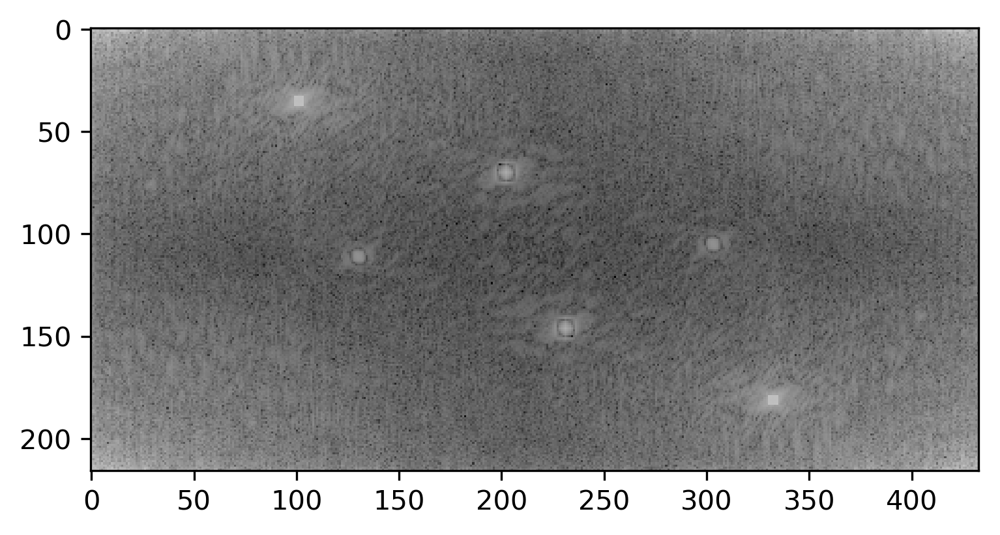

(216, 433) <class 'numpy.complex128'>


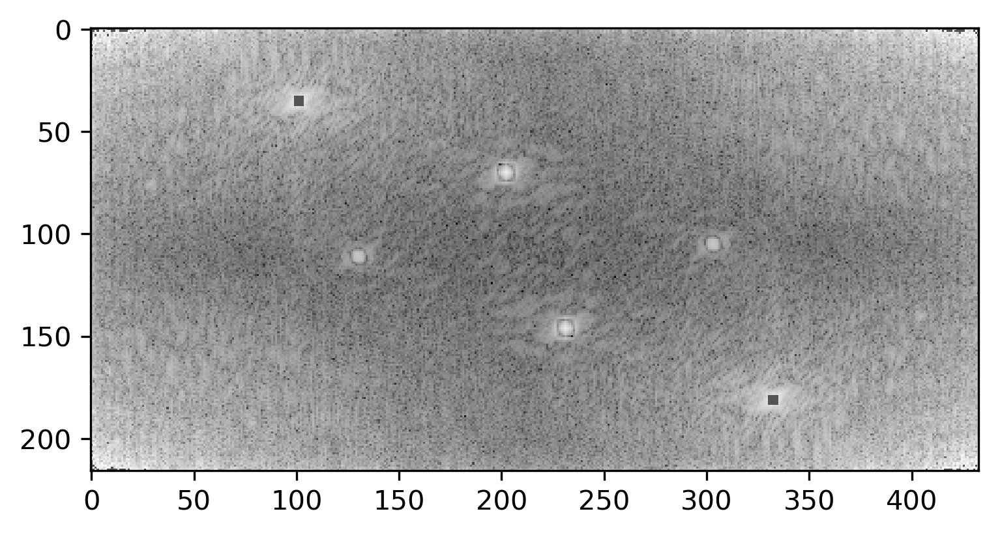

(216, 433) <class 'numpy.complex128'>
(216, 433) <class 'numpy.complex128'>


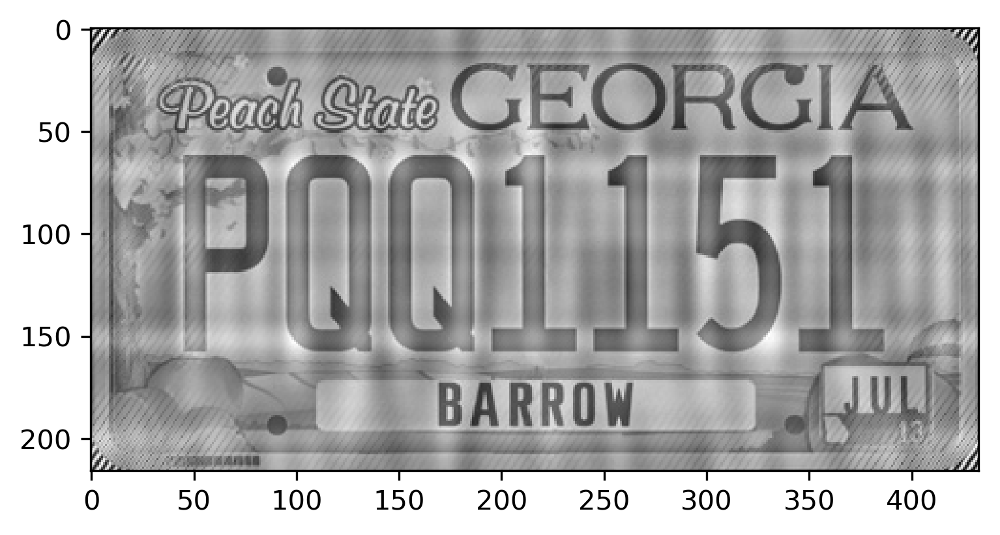

In [42]:
im = imread('license_plate.png')
print(im.shape,type(im[0,0]))
plt.imshow(im,cmap='gray')
plt.show()
im_dft = fftpack.fft2(im)
plt.imshow(np.log(np.abs(im_dft)),cmap='gray')
plt.show()
print(im_dft.shape,type(im_dft[0,0]))
im_dft[np.where(np.log(np.abs(im_dft))>12)] = np.mean(im_dft)
plt.imshow(np.log(np.abs(im_dft)),cmap='gray')
plt.show()
print(im_dft.shape,type(im_dft[0,0]))
im = fftpack.ifft2(im_dft)
print(im.shape,type(im[0,0]))
plt.imshow(np.real(im),cmap='gray')
plt.show()

The year on the sticker is...